In [ ]:
import tensorflow_datasets as tfds
from itertools import islice

In [ ]:
ds = tfds.load("wiki40b/fr", split="test", data_dir="gs://tfds-data/datasets")
sample = [ex["text"].numpy().decode("utf-8")
for ex in islice(ds.shuffle(buffer_size=10_000), 100)]

In [ ]:
# Iterate over the first few examples in the dataset
for example in ds.take(5):  # Adjust the number '5' to however many samples you want
    print(example["text"].numpy().decode("utf-8"))


_START_ARTICLE_
Croix de Soing-Cubry-Charentenay
_START_SECTION_
Localisation
_START_PARAGRAPH_
La croix est située sur la commune de Soing-Cubry-Charentenay, dans le département français de la Haute-Saône.
_START_SECTION_
Historique
_START_PARAGRAPH_
L'édifice est inscrit au titre des monuments historiques en 1989.

_START_ARTICLE_
C2 (cryptographie)
_START_SECTION_
Description
_START_PARAGRAPH_
Le C2 est basé sur un réseau de Feistel avec 10 tours. Comme DES, sa clé est de 56 bits avec un bloc de 64 bits. Les spécifications du chiffrement et du déchiffrement sont disponibles pour des évaluations, mais l'implémentation du C2 nécessite l'acquisition d'une licence auprès de 4C Entity afin d'obtenir le contenu des S-Boxes.
_START_SECTION_
Attaques
_START_PARAGRAPH_
En raison de sa clé relativement courte, l'algorithme peut être attaqué avec une recherche exhaustive implémentée sur du matériel performant._NEWLINE_Après l'annonce des diffuseurs de HDTV qui indiquait leur volonté de distri

In [ ]:
print(len(ds))

68004


In [ ]:
!pip install pyicu
!pip install pycld2
!pip install morfessor
!pip install polyglot

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 262.4/262.4 kB 11.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pyicu: filename=PyICU-2.13.1-cp310-cp310-linux_x86_64.whl size=1801404 sha256=68a0a21aec8f9621ea14871f3bd812bb885cbd9f0eca5cf9901ee353bab09a0d
  Stored in directory: /root/.cache/pip/wheels/8e/45/08/f4bc505e31eb7bb779d493226921abf18cf55ed30142e70eae
Successfully built pyicu
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 MB 22.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pycld2: filename=pycld2-0.41-cp310-cp310-linux_x86_64.whl size=9904061 sha256=80bf5b664f20cfa1a72a439fa946db5e638b6da4a83d803e33469b57399842e0
  Stored in directory: /root/.cache/pip/wheels/be/81/31/240c89c845e008a93d98542325270007de595bfd356eb0b06c
Successfully built pycld2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.3/126.3 kB 9.5 MB/s

In [ ]:
import random
from polyglot.text import Text
import re

In [ ]:
def get_sentences(language, nb_sentences) -> list[Text]:
  """
  Extract a list of unique sentences.
  Arguments:
    - language: language code;
    - nb_sentences: number of sentences to extract (train + test).
  Returns:
    - a list of tokenized unique sentences.
  """
  sentences = set()
  print(f"Processing and tokenizing {language}")

  # Load and shuffer the dataset for some language
  ds = tfds.load(f"wiki40b/{language}", split="test", data_dir="gs://tfds-data/datasets")
  ds = [ex for ex in islice(ds.shuffle(buffer_size=10_000), nb_sentences)]

  for article in ds:
    text = article["text"].numpy().decode("utf-8")
    # Remove unwanted markers
    for markers in ["_START_ARTICLE_\n", "_START_SECTION_\n", "_START_PARAGRAPH_\n", "\n", "_NEWLINE_"]:
      text = text.replace(markers, " ")
    # Use Polyglot to split the text into sentences and detect language
    segmented_text = Text(text, hint_language_code=language)
    # Extract sentences and tokenize them, store them in the set
    for sentence in segmented_text.sentences:
      sentences.add(" ".join(sentence.words))

  return list(sentences)

In [ ]:
def clean_text(sentence):
  """
  Remove punctuation and all numbers from the sentence
  """
  # Punctuation symbols surrounded by spaces or with space on one side to be removed
  punctuations = r'\s([?.!,;:"\-()\/|\'“”"\[\]،–„’«»।。、%，・])\s?'

  # Remove punctuation
  cleaned_sentence = re.sub(punctuations, ' ', sentence)

  # Remove all numbers
  cleaned_sentence = re.sub(r'\d+', '', cleaned_sentence)

  # Remove extra spaces
  cleaned_sentence = re.sub(r'\s+', ' ', cleaned_sentence).strip()

  return cleaned_sentence

def save_to_file(sentences, language, file_name):
  """
  Save tokenized sentences to a file
  Arguments:
    - sentences: list of tokenized sentences,
    - language: language code,
    - file_name: train or test.
  """
  with open(f'/content/{language}_{file_name}.txt', 'w') as file:
    for sentence in sentences:
      # Remove punctuation and numbers
      cleaned_sentence = clean_text(sentence)

      # Write the cleaned sentence to the file
      file.write(cleaned_sentence + "\n")


In [ ]:
l_codes = ["ar", "bg", "ca", "cs", "da", "de", "el", "en", "es", "et", "fa",
          "fi", "fr", "he", "hi", "hr", "hu", "id", "it", "ja", "ko", "lt",
          "lv", "ms", "nl", "no", "pl", "pt", "ro", "ru", "sk", "sl", "sr",
          "sv", "th", "tl", "tr", "uk", "vi", "zh-cn", "zh-tw"]

for l in l_codes:
  sentences = get_sentences(l, nb_sentences=43_000)

  train_set = sentences[:43_000]
  test_set = sentences[40_000:43_000]

  save_to_file(train_set, l, "train")
  save_to_file(test_set, l, "test")

Processing and tokenizing ar


Processing and tokenizing bg


Processing and tokenizing ca


Processing and tokenizing cs


Processing and tokenizing da


Processing and tokenizing de


Processing and tokenizing el


Processing and tokenizing en


Processing and tokenizing es


Streaming output truncated to the last 5000 lines.


Processing and tokenizing et


Processing and tokenizing fa


Processing and tokenizing fi


Processing and tokenizing fr


Streaming output truncated to the last 5000 lines.


Processing and tokenizing he


Processing and tokenizing hi


Processing and tokenizing hr


Processing and tokenizing hu


Processing and tokenizing id


Processing and tokenizing it


Streaming output truncated to the last 5000 lines.


Processing and tokenizing ja


Processing and tokenizing ko


Processing and tokenizing lt


Processing and tokenizing lv


Processing and tokenizing ms


Processing and tokenizing nl


Streaming output truncated to the last 5000 lines.


Processing and tokenizing no


Processing and tokenizing pl


Processing and tokenizing pt


Processing and tokenizing ro


Processing and tokenizing ru


Streaming output truncated to the last 5000 lines.


Processing and tokenizing sk


Processing and tokenizing sl


Processing and tokenizing sr


Streaming output truncated to the last 5000 lines.


Processing and tokenizing sv


Streaming output truncated to the last 5000 lines.


Processing and tokenizing th


Processing and tokenizing tl


Processing and tokenizing tr


Processing and tokenizing uk


Processing and tokenizing vi


Processing and tokenizing zh-cn


Streaming output truncated to the last 5000 lines.


Processing and tokenizing zh-tw


Streaming output truncated to the last 5000 lines.


In [ ]:
!ls

ar_test.txt   el_test.txt   fr_test.txt   it_test.txt	nl_test.txt   sample_data   tl_train.txt
ar_train.txt  el_train.txt  fr_train.txt  it_train.txt	nl_train.txt  sk_test.txt   tr_test.txt
bg_test.txt   en_test.txt   he_test.txt   ja_test.txt	no_test.txt   sk_train.txt  tr_train.txt
bg_train.txt  en_train.txt  he_train.txt  ja_train.txt	no_train.txt  sl_test.txt   uk_test.txt
ca_test.txt   es_test.txt   hi_test.txt   ko_test.txt	pl_test.txt   sl_train.txt  uk_train.txt
ca_train.txt  es_train.txt  hi_train.txt  ko_train.txt	pl_train.txt  sr_test.txt   vi_test.txt
cs_test.txt   et_test.txt   hr_test.txt   lt_test.txt	pt_test.txt   sr_train.txt  vi_train.txt
cs_train.txt  et_train.txt  hr_train.txt  lt_train.txt	pt_train.txt  sv_test.txt   zh-cn_test.txt
da_test.txt   fa_test.txt   hu_test.txt   lv_test.txt	ro_test.txt   sv_train.txt  zh-cn_train.txt
da_train.txt  fa_train.txt  hu_train.txt  lv_train.txt	ro_train.txt  th_test.txt   zh-tw_test.txt
de_test.txt   fi_test.txt   id_test.txt  

In [ ]:
def read_sentences(language, file_name):
  with open(f'/content/{language}_{file_name}.txt', 'r') as f:
    sentences = f.readlines()
  return [sentence.strip() for sentence in sentences]

In [ ]:
ttr_results = []
def compute_ttr(language):
  """
  Compute TTR
  Arguments:
    - language: language code
  Returns:
    - TTR values
  """
  # Read train and test sentences
  train_sentences = read_sentences(language, "train")
  test_sentences = read_sentences(language, "test")
  all_sentences = train_sentences + test_sentences

  tokens = []
  for sentence in all_sentences:
    tokens.extend(sentence.split())  # Split each sentence into tokens (words)

  types = set(tokens)  # Unique words (types)
  ttr = len(types) / len(tokens)

  ttr_results.append({'Language': language, 'TTR': ttr})

In [ ]:
# Compute_ttr for each language
for l in l_codes:
  compute_ttr(l)

In [ ]:
import pandas as pd

In [ ]:
# Create a dataframe
df = pd.DataFrame(ttr_results)

# Display the DataFrame
print(df)

   Language       TTR
0        ar  0.128273
1        bg  0.120455
2        ca  0.082325
3        cs  0.174451
4        da  0.119564
5        de  0.150821
6        el  0.106613
7        en  0.087207
8        es  0.083759
9        et  0.207137
10       fa  0.070015
11       fi  0.257521
12       fr  0.094449
13       he  0.150416
14       hi  0.069641
15       hr  0.152811
16       hu  0.185343
17       id  0.088696
18       it  0.096328
19       ja  0.052699
20       ko  0.266702
21       lt  0.174039
22       lv  0.128399
23       ms  0.073489
24       nl  0.114838
25       no  0.129902
26       pl  0.183321
27       pt  0.084909
28       ro  0.097085
29       ru  0.185155
30       sk  0.165474
31       sl  0.141310
32       sr  0.167980
33       sv  0.145809
34       th  0.014703
35       tl  0.106938
36       tr  0.179351
37       uk  0.181693
38       vi  0.033370
39    zh-cn  0.045230
40    zh-tw  0.053838


In [ ]:
# Optionally, save the DataFrame to a CSV file
df.to_csv('/content/language_ttr_results.csv', index=False)

In [ ]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# List of language codes
l_codes = ["ar", "bg", "ca", "cs", "da", "de", "el", "en", "es", "et", "fa",
           "fi", "fr", "he", "hi", "hr", "hu", "id", "it", "ja", "ko", "lt",
           "lv", "ms", "nl", "no", "pl", "pt", "ro", "ru", "sk", "sl", "sr",
           "sv", "th", "tl", "tr", "uk", "vi", "zh-cn", "zh-tw"]

# Create a directory in Google Drive to store the files
drive_dir = '/content/drive/MyDrive/wiki40b_language_files/'
os.makedirs(drive_dir, exist_ok=True)

# Copy train and test files for each language to Google Drive
for lang in l_codes:
    train_file = f'/content/{lang}_train.txt'
    test_file = f'/content/{lang}_test.txt'

    # Check if the files exist before copying
    if os.path.exists(train_file) and os.path.exists(test_file):
        # Copy the files to Google Drive
        !cp {train_file} {drive_dir}
        !cp {test_file} {drive_dir}
    else:
        print(f"Files for {lang} not found.")

print("All files have been copied to Google Drive.")


Mounted at /content/drive
All files have been copied to Google Drive.


In [ ]:
l_typology = {
    "isolating": ["id", "ms", "th", "tl", "vi", "zh-cn", "zh-tw"],
    "fusional": ["bg", "ca", "cs", "da", "de", "el", "en", "es", "fa",
        "fr", "hi", "hr", "it", "lt", "lv", "nl", "no", "pl",
        "pt", "ro", "ru", "sk", "sl", "sr", "sv", "uk"],
    "introflexive": ["ar", "he"],
    "agglutinative": ["et", "fi", "hu", "ja", "ko", "tr"]
}

In [ ]:
!git clone https://github.com/kpu/kenlm.git
%cd kenlm
!python setup.py develop
!mkdir -p build
%cd build
!cmake ..
!make -j 4

Cloning into 'kenlm'...
remote: Enumerating objects: 14170, done.
remote: Counting objects: 100% (483/483), done.
remote: Compressing objects: 100% (337/337), done.
remote: Total 14170 (delta 167), reused 410 (delta 132), pack-reused 13687 (from 1)
Receiving objects: 100% (14170/14170), 5.91 MiB | 14.14 MiB/s, done.
Resolving deltas: 100% (8047/8047), done.
/content/kenlm/build/kenlm/build/kenlm
Will build with KenLM max_order set to 6
running develop
/usr/local/lib/python3.10/dist-packages/setuptools/command/develop.py:42: EasyInstallDeprecationWarning: easy_install command is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` and ``easy_install``.
        Instead, use pypa/build, pypa/installer or other
        standards-based tools.

        See https://github.com/pypa/setuptools/issues/917 for details.
        ******************************************************************************

In [ ]:
import os
os.makedirs("/content/models", exist_ok=True)

In [ ]:
for l in l_codes:
  print(f"Training {l}")
  os.system(f"/content/kenlm/build/bin/lmplz -o 5 </content/{l}_train.txt >/content/models/{l}_model.arpa")

Training ar
Training bg
Training ca
Training cs
Training da
Training de
Training el
Training en
Training es
Training et
Training fa
Training fi
Training fr
Training he
Training hi
Training hr
Training hu
Training id
Training it
Training ja
Training ko
Training lt
Training lv
Training ms
Training nl
Training no
Training pl
Training pt
Training ro
Training ru
Training sk
Training sl
Training sr
Training sv
Training th
Training tl
Training tr
Training uk
Training vi
Training zh-cn
Training zh-tw


In [ ]:
import kenlm.kenlm as kenlm
from tqdm import tqdm

In [ ]:
results = []

for l in tqdm(l_codes):
  print(f"Estimating perplexity for {l}")

  # Load the trained model for each language
  m = kenlm.Model(f'/content/models/{l}_model.arpa')

  # Read the sentences from test set
  sentences = read_sentences(l, 'test')

  # Skip if no sentences are found
  if not sentences:
    print(f"No sentences found for {l}, skipping.")
    continue

  # Calculate total perplexity for the sentences
  total_perplexity = 0
  sentence_count = 0

  for sentence in sentences:
    # Calculate perplexity for each sentence
    perplexity = m.perplexity(sentence)
    total_perplexity += perplexity
    sentence_count += 1

  # Store the average perplexity for each language
  if sentence_count > 0:
    avg_perplexity = total_perplexity / sentence_count
    results.append({'Language': l, 'Perplexity': avg_perplexity})
    print(f"Perplexity for {l}: {avg_perplexity}")
  else:
    print(f"No valid sentences for perplexity calculation for {l}.")

# Convert results to a DataFrame
df_perplexity = pd.DataFrame(results)

  0%|          | 0/41 [00:00<?, ?it/s]

Estimating perplexity for ar


  2%|▏         | 1/41 [00:03<02:36,  3.92s/it]

Perplexity for ar: 38.610009700570494
Estimating perplexity for bg


  5%|▍         | 2/41 [00:06<01:58,  3.05s/it]

Perplexity for bg: 24.800380473664966
Estimating perplexity for ca


  7%|▋         | 3/41 [00:09<02:00,  3.17s/it]

Perplexity for ca: 26.5054762277481
Estimating perplexity for cs


 10%|▉         | 4/41 [00:12<01:49,  2.97s/it]

Perplexity for cs: 38.954778647844854
Estimating perplexity for da


 12%|█▏        | 5/41 [00:14<01:42,  2.86s/it]

Perplexity for da: 35.80465121297908
Estimating perplexity for de


 15%|█▍        | 6/41 [00:17<01:38,  2.81s/it]

Perplexity for de: 40.701221338480735
Estimating perplexity for el


 17%|█▋        | 7/41 [00:20<01:39,  2.94s/it]

Perplexity for el: 26.04443255275045
Estimating perplexity for en


 20%|█▉        | 8/41 [00:23<01:31,  2.77s/it]

Perplexity for en: 23.91310617313529
Estimating perplexity for es


 22%|██▏       | 9/41 [00:25<01:25,  2.66s/it]

Perplexity for es: 26.73028706141136
Estimating perplexity for et


 24%|██▍       | 10/41 [00:27<01:09,  2.24s/it]

Perplexity for et: 38.20872395806921
Estimating perplexity for fa


 27%|██▋       | 11/41 [00:29<01:08,  2.27s/it]

Perplexity for fa: 37.898929309002995
Estimating perplexity for fi


 29%|██▉       | 12/41 [00:30<00:57,  1.99s/it]

Perplexity for fi: 51.190507878358886
Estimating perplexity for fr


 32%|███▏      | 13/41 [00:33<01:00,  2.16s/it]

Perplexity for fr: 25.665098753540967
Estimating perplexity for he


 34%|███▍      | 14/41 [00:36<01:03,  2.36s/it]

Perplexity for he: 29.344774507603017
Estimating perplexity for hi


 37%|███▋      | 15/41 [00:38<01:03,  2.43s/it]

Perplexity for hi: 25.22244946374501
Estimating perplexity for hr


 39%|███▉      | 16/41 [00:41<01:01,  2.47s/it]

Perplexity for hr: 33.28433821853158
Estimating perplexity for hu


 41%|████▏     | 17/41 [00:44<01:01,  2.58s/it]

Perplexity for hu: 47.26354782912716
Estimating perplexity for id


 44%|████▍     | 18/41 [00:46<00:59,  2.59s/it]

Perplexity for id: 25.889756171327914
Estimating perplexity for it


 46%|████▋     | 19/41 [00:50<01:04,  2.94s/it]

Perplexity for it: 26.358645088977205
Estimating perplexity for ja


 49%|████▉     | 20/41 [00:54<01:06,  3.17s/it]

Perplexity for ja: 16.12737541138869
Estimating perplexity for ko


 51%|█████     | 21/41 [00:56<01:00,  3.02s/it]

Perplexity for ko: 72.78520513813542
Estimating perplexity for lt


 54%|█████▎    | 22/41 [00:58<00:50,  2.66s/it]

Perplexity for lt: 36.69526505666192
Estimating perplexity for lv


 56%|█████▌    | 23/41 [01:00<00:43,  2.40s/it]

Perplexity for lv: 22.761557813039364
Estimating perplexity for ms


 59%|█████▊    | 24/41 [01:02<00:38,  2.24s/it]

Perplexity for ms: 29.465711963300265
Estimating perplexity for nl


 61%|██████    | 25/41 [01:03<00:32,  2.06s/it]

Perplexity for nl: 34.22533072396495
Estimating perplexity for no


 63%|██████▎   | 26/41 [01:05<00:29,  1.94s/it]

Perplexity for no: 38.887738761886204
Estimating perplexity for pl


 66%|██████▌   | 27/41 [01:07<00:25,  1.83s/it]

Perplexity for pl: 43.05463478794141
Estimating perplexity for pt


 68%|██████▊   | 28/41 [01:09<00:25,  1.94s/it]

Perplexity for pt: 27.366859875358553
Estimating perplexity for ro


 71%|███████   | 29/41 [01:11<00:23,  1.95s/it]

Perplexity for ro: 26.81913945158557
Estimating perplexity for ru


 73%|███████▎  | 30/41 [01:14<00:23,  2.16s/it]

Perplexity for ru: 42.36210816643818
Estimating perplexity for sk


 76%|███████▌  | 31/41 [01:16<00:21,  2.19s/it]

Perplexity for sk: 33.67654489771589
Estimating perplexity for sl


 78%|███████▊  | 32/41 [01:18<00:20,  2.28s/it]

Perplexity for sl: 28.440457869144602
Estimating perplexity for sr


 80%|████████  | 33/41 [01:21<00:19,  2.38s/it]

Perplexity for sr: 33.295869986251425
Estimating perplexity for sv


 83%|████████▎ | 34/41 [01:23<00:16,  2.40s/it]

Perplexity for sv: 43.959074592257245
Estimating perplexity for th


 85%|████████▌ | 35/41 [01:28<00:18,  3.02s/it]

No sentences found for th, skipping.
Estimating perplexity for tl


 88%|████████▊ | 36/41 [01:28<00:11,  2.32s/it]

No sentences found for tl, skipping.
Estimating perplexity for tr


 90%|█████████ | 37/41 [01:31<00:09,  2.35s/it]

Perplexity for tr: 40.63578911485054
Estimating perplexity for uk


 93%|█████████▎| 38/41 [01:34<00:07,  2.43s/it]

Perplexity for uk: 43.06028988829563
Estimating perplexity for vi


 95%|█████████▌| 39/41 [01:37<00:05,  2.70s/it]

Perplexity for vi: 16.281244552568584
Estimating perplexity for zh-cn


 98%|█████████▊| 40/41 [01:40<00:02,  2.98s/it]

Perplexity for zh-cn: 21.27832965120211
Estimating perplexity for zh-tw


100%|██████████| 41/41 [01:44<00:00,  2.54s/it]

Perplexity for zh-tw: 24.04348174057433


In [ ]:
print(df_perplexity)

   Language  Perplexity
0        ar   38.610010
1        bg   24.800380
2        ca   26.505476
3        cs   38.954779
4        da   35.804651
5        de   40.701221
6        el   26.044433
7        en   23.913106
8        es   26.730287
9        et   38.208724
10       fa   37.898929
11       fi   51.190508
12       fr   25.665099
13       he   29.344775
14       hi   25.222449
15       hr   33.284338
16       hu   47.263548
17       id   25.889756
18       it   26.358645
19       ja   16.127375
20       ko   72.785205
21       lt   36.695265
22       lv   22.761558
23       ms   29.465712
24       nl   34.225331
25       no   38.887739
26       pl   43.054635
27       pt   27.366860
28       ro   26.819139
29       ru   42.362108
30       sk   33.676545
31       sl   28.440458
32       sr   33.295870
33       sv   43.959075
34       tr   40.635789
35       uk   43.060290
36       vi   16.281245
37    zh-cn   21.278330
38    zh-tw   24.043482


In [ ]:
# Merging the dataframes with TTR and with perplexity
df_merged = pd.merge(df, df_perplexity, on='Language')

# Display the merged DataFrame
print(df_merged.head())

  Language       TTR  Perplexity
0       ar  0.128273   38.610010
1       bg  0.120455   24.800380
2       ca  0.082325   26.505476
3       cs  0.174451   38.954779
4       da  0.119564   35.804651


In [ ]:
# Map language to typology
def get_typology(language):
  for typology, langs in l_typology.items():
    if language in langs:
      return typology
  return 'unknown'

df_merged['Typology'] = df_merged['Language'].apply(get_typology)

print(df_merged)

   Language       TTR  Perplexity       Typology
0        ar  0.128273   38.610010   introflexive
1        bg  0.120455   24.800380       fusional
2        ca  0.082325   26.505476       fusional
3        cs  0.174451   38.954779       fusional
4        da  0.119564   35.804651       fusional
5        de  0.150821   40.701221       fusional
6        el  0.106613   26.044433       fusional
7        en  0.087207   23.913106       fusional
8        es  0.083759   26.730287       fusional
9        et  0.207137   38.208724  agglutinative
10       fa  0.070015   37.898929       fusional
11       fi  0.257521   51.190508  agglutinative
12       fr  0.094449   25.665099       fusional
13       he  0.150416   29.344775   introflexive
14       hi  0.069641   25.222449       fusional
15       hr  0.152811   33.284338       fusional
16       hu  0.185343   47.263548  agglutinative
17       id  0.088696   25.889756      isolating
18       it  0.096328   26.358645       fusional
19       ja  0.05269

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

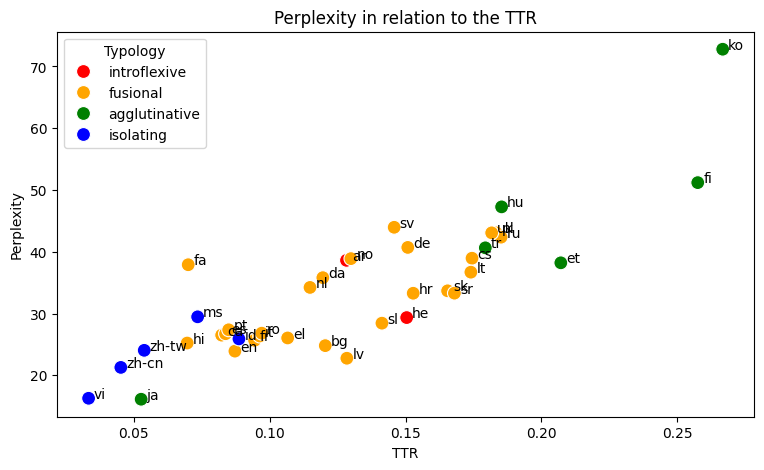

In [ ]:
typology_colors = {
    "isolating": "blue",
    "fusional": "orange",
    "agglutinative": "green",
    "introflexive": "red"
}

plt.figure(figsize=(9, 5))

sns.scatterplot(data=df_merged,
                x='TTR',
                y='Perplexity',
                hue='Typology',
                palette=typology_colors,
                marker='o',
                s=100)

# Annotations for each language
for i, row in df_merged.iterrows():
  plt.text(row['TTR'] + 0.002, row['Perplexity'], row['Language'], fontsize=10)

plt.xlabel('TTR')
plt.ylabel('Perplexity')
plt.title('Perplexity in relation to the TTR')

plt.show()
